In [2]:
import numpy as np
import scipy.linalg as la
import math as math
import matplotlib.pyplot as plt
import sympy as sy
from itertools import chain
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import colors

# Lead Titanate implementation Hamiltonian
The Hamiltonian that we implement below is technically only valid around the Gamma point $\Gamma = (0,0,0)$ (where the bracket signals a $k$-space vector)

In the first step we implement this Hamiltonian numerically (where the basis are the different orbitals) and then we compute the magnetic moment in $x$ and $y$ using


### Relevant Parameters

In [3]:
def convert_units():
    '''Convert between Rybderg and electron-volts for hopping parameters'''
    return


def get_Hamiltonian(a, k_x, k_y, k_z, broken_inversion):
    '''
    a: Lattice constant
    k_x, k_y, k_z: different component of the reciprocal space vector
    '''

    conv_ry_eV = 13.6


    if broken_inversion == True:
        bi_factor = 1
    else:
        bi_factor = 0
    # Defintion of Shape of Hamiltonian
    ham = np.zeros((3,3), dtype = complex)

    t_1_eff = 0.0495*conv_ry_eV
    t_2_eff = -0.0226*conv_ry_eV
    t_3_eff = 0.0040*conv_ry_eV
    t_4_eff = 0.1009*conv_ry_eV
    t_5_eff = - 0.0019*conv_ry_eV
    t_6_eff = - 0.0097*conv_ry_eV
    t_7_eff = - 0.0159*conv_ry_eV
    t_8_eff = 0.0022*conv_ry_eV

    t_y = 0.0007*conv_ry_eV

    #t_difference corresponds to t_13 - t_14
    t_difference = 0.0024*conv_ry_eV

    var1  = (1.065)**2*a**2 *k_z**2

    h_11 = t_1_eff - t_2_eff*(k_x**2 + k_y**2)*a**2 - t_3_eff*var1
    h_22 = t_4_eff - t_5_eff*k_x**2*a**2 - t_6_eff*k_y**2*a**2 -  t_7_eff*var1
    h_33 = t_4_eff - t_6_eff*k_x**2*a**2 - t_5_eff*k_y**2*a**2 - t_7_eff*var1
    h_12 = -2*t_difference*1.065*k_x*k_z*a**2 + 1j*bi_factor*t_8_eff*k_x*a
    h_13 = -2*t_difference*1.065*k_y*k_z*a**2 + 1j*bi_factor*t_8_eff*k_y*a
    h_23 = -4*t_y*k_x*k_y*a**2


    ham[0,0] = h_11
    ham[0,1] = h_12
    ham[0,2] = h_13
    ham[1,0] = np.conjugate(h_12)
    ham[1,1] = h_22
    ham[1,2] = h_23
    ham[2,0] = np.conjugate(h_13)
    ham[2,1] = np.conjugate(h_23)
    ham[2,2] = h_33

    #print(h_12)

    return ham

def eigvals_and_eigvectors(ham):
    eigvals, U = np.linalg.eigh(ham)
    U = np.matrix(U)
    # print("Eigenvalues: {}".format(eigvals))
    # print("Eigenvectors: {}".format(U))
    return eigvals, U

In [4]:
get_Hamiltonian(a=1, k_x=-1, k_y=-1, k_z=0, broken_inversion=False)

array([[ 1.28792+0.j,  0.     +0.j,  0.     +0.j],
       [ 0.     -0.j,  1.53   +0.j, -0.03808+0.j],
       [ 0.     -0.j, -0.03808+0.j,  1.53   +0.j]])

In [5]:
def magnetization(Hamiltonian, eigenvalue):
    e_charge = 1.602*10**(-14)
    planck_constant = 6.626*10**(-34)
    constant_prefactor = e_charge/planck_constant
    print(constant_prefactor)
    difference = Hamiltonian - eigenvalue

In [13]:
is_2d = True

# Magnetic moment axis, can be from the following set "y", "x", "z"
axis = "y"


# The units of the magnetization are given as e/hbar A^2 eV
conv_eV_Bohr =  1/3.809

def get_magnetic_momentum(k_x, k_y, k_z, axis, broken_inversion):
    
    lattice_constant = 3.902

    Hamiltonian = get_Hamiltonian(lattice_constant, k_x, k_y, k_z, broken_inversion)
    eigval, eigvec = eigvals_and_eigvectors(Hamiltonian)

    smallest_eigval = np.min(eigval)
    smallest_eigvec = eigvec[0]
    # print("Smallest Eigenvector: {}".format(smallest_eigvec))
    # print("Smallest Eigenvalue: {}".format(smallest_eigval))

    dx = 0.05
    dy = 0.05
    dz = 0.05

    Hamiltonian_difference = Hamiltonian - np.identity(3)*np.min(eigval)

    diff_Hamiltonian_x = (get_Hamiltonian(1, k_x + dx, k_y, k_z, broken_inversion) -  get_Hamiltonian(1, k_x - dx, k_y, k_z, broken_inversion))/(2*dx)
    diff_Hamiltonian_y = (get_Hamiltonian(1, k_x, k_y + dy, k_z, broken_inversion) - get_Hamiltonian(1, k_x, k_y - dy, k_z, broken_inversion))/(2*dy)
    diff_Hamiltonian_z = (get_Hamiltonian(1, k_x, k_y, k_z +dz, broken_inversion) - get_Hamiltonian(1, k_x, k_y, k_z - dz, broken_inversion))/(2*dz)
    
    '''For later the below constants can be introduced'''
    e_charge = 1.602*10**(-19)
    planck_constant = 6.626*10**(-34)
    #constant_prefactor = e_charge/planck_constant
    #constant_prefactor = 1.519*10**15
    constant_prefactor = 1

    if axis == 'y':
        m_y = 0
        # We start summing from one for the sum over m not including n (the lowest eigenvalue vector)
        for i in range(1, np.shape(eigvec)[0]):
            E_m =  eigval[i]
            E_n = smallest_eigval
            ket_u_n = smallest_eigvec.T
            ket_u_m = eigvec[i].T
            bra_u_n =  (ket_u_n.conjugate()).T
            bra_u_m = (ket_u_m.conjugate()).T

            expression_1 = bra_u_n * diff_Hamiltonian_z * ket_u_m
            expression_2 = bra_u_m*diff_Hamiltonian_x*ket_u_n
            print("First expression: {}".format(expression_1))
            print("Second expression: {}".format(expression_2))

            #print("Shapes: {}".format(np.shape(ket_u_n), np.shape(bra_u_n)))
            m_y += - constant_prefactor*expression_1*expression_2/(E_m - E_n)

            # Convert to Bohr Magneton units
            
            #print(m_y)
        m_y = conv_eV_Bohr*m_y
        m_y = m_y.imag
        return m_y
    if axis == 'x':
        m_x = 0
        for i in range(1, np.shape(eigvec)[0]):
            E_m =  eigval[i]
            E_n = smallest_eigval
            ket_u_n = smallest_eigvec.T
            ket_u_m = eigvec[i].T
            bra_u_n =  (ket_u_n.conjugate()).T
            bra_u_m = (ket_u_m.conjugate()).T

            expression_1 = bra_u_n * diff_Hamiltonian_y * ket_u_m
            expression_2 = bra_u_m*diff_Hamiltonian_z*ket_u_n
            print("First expression: {}".format(expression_1))
            print("Second expression: {}".format(expression_2))

            #print("Shapes: {}".format(np.shape(ket_u_n), np.shape(bra_u_n)))
            m_x += - constant_prefactor*expression_1*expression_2/(E_m - E_n)

            # Convert to Bohr Magneton units
            
            #print(m_y)
        m_x = conv_eV_Bohr*m_x
        m_x = m_x.imag
        return m_x
    if axis == "z":
        m_z = 0
        for i in range(1, np.shape(eigvec)[0]):
            print("Current Index eigenvalue: {}".format(i))
            #print("Nr of eigenvalues: {}".format(np.shape(eigvec)[0]))
            E_m =  eigval[i]
            E_n = smallest_eigval
            ket_u_n = smallest_eigvec.T
            ket_u_m = eigvec[i].T
            bra_u_n =  (ket_u_n.conjugate()).T
            bra_u_m = (ket_u_m.conjugate()).T

            expression_1 = bra_u_n * diff_Hamiltonian_x * ket_u_m
            expression_2 = bra_u_m*diff_Hamiltonian_y*ket_u_n
            # print("First expression: {}".format(expression_1))
            # print("Second expression: {}".format(expression_2))

            print("Total expression: {}".format(expression_1*expression_2))


            ## TEMPORARY
            # expression_1 = 1000*expression_1
            # expression_2 = 1000* expression_2

            #print("Shapes: {}".format(np.shape(ket_u_n), np.shape(bra_u_n)))
            print("M_z: {}".format(m_z))
            m_z += - (constant_prefactor*expression_1*expression_2)/(E_m - E_n)
        
            #print(m_y)
        m_z = conv_eV_Bohr*m_z
        m_z = m_z.imag
        print("M_z_final: {}".format(m_z))
        return m_z


def create_magmoment_grid(nr_points, min_point, max_point, axis, broken_inversion, z_axis =  False):
    k_x = k_y = np.linspace(min_point, max_point, nr_points)

    mag_grid = np.zeros((nr_points,nr_points), dtype = float)

    if z_axis != False:
        k_z = np.linspace(min_point, max_point, nr_points)
    else:
        k_z = 0

    if k_z == 0:
        if axis == "y":
            for i in k_y:
                for j in k_x:
                    print("x: {}, y: {}".format(j, i))
                    local_magnetic_moment = get_magnetic_momentum(i, j, 0, axis = "y", broken_inversion= broken_inversion)
                    local_magnetic_moment = local_magnetic_moment[0,0]
                    x_index = (np.where(k_x == j))[0]
                    y_index = (np.where(k_y == i))[0]
                    print("x_index: {}; y_index: {}".format(x_index, y_index))
                    print("Magnetic moment at point x: {}, y: {} is {}".format(j, i, local_magnetic_moment))
                    mag_grid[x_index, y_index] = local_magnetic_moment

            print("Dimension of meshgrid: {}".format(np.shape(mag_grid)))
            return mag_grid, k_x, k_y, k_z
        if axis == "x":
            for i in k_y:
                for j in k_x:
                    print("x: {}, y: {}".format(j, i))
                    local_magnetic_moment = get_magnetic_momentum(i, j, 0, axis = "x", broken_inversion = broken_inversion)
                    local_magnetic_moment = local_magnetic_moment[0,0]
                    x_index = (np.where(k_x == j))[0]
                    y_index = (np.where(k_y == i))[0]
                    print("x_index: {}; y_index: {}".format(x_index, y_index))
                    print("Magnetic moment at point x: {}, y: {} is {}".format(j, i, local_magnetic_moment))
                    mag_grid[x_index, y_index] = local_magnetic_moment
            return mag_grid, k_x, k_y, k_z

        if axis == "z":
            for i in k_y:
                for j in k_x:
                    # print("x: {}, y: {}".format(j, i))
                    local_magnetic_moment = get_magnetic_momentum(i, j, 0, axis = "z", broken_inversion=broken_inversion)
                    local_magnetic_moment = local_magnetic_moment[0,0]
                    x_index = (np.where(k_x == j))[0]
                    y_index = (np.where(k_y == i))[0]
                    # print("x_index: {}; y_index: {}".format(x_index, y_index))
                    # print("Magnetic moment at point x: {}, y: {} is {}".format(j, i, local_magnetic_moment))
                    mag_grid[x_index, y_index] = local_magnetic_moment
            return mag_grid, k_x, k_y, k_z
            
                #print(magnetization)
                # Turns the coordinate tuple into a basis index
                #print(basis.index((i,j)))


x: -0.1, y: -0.1
First expression: [[-0.01510783+0.01545621j]]
Second expression: [[0.00342719-0.0084312j]]
First expression: [[0.01510783-0.01414438j]]
Second expression: [[-0.00342719-0.00138711j]]
x_index: [0]; y_index: [0]
Magnetic moment at point x: -0.1, y: -0.1 is -8.717767897123215e-05
x: -0.09797979797979799, y: -0.1
First expression: [[0.02052495+0.00056753j]]
Second expression: [[5.14129389e-15-0.00037716j]]
First expression: [[-0.02175598+0.00070891j]]
Second expression: [[-5.24622485e-15-0.00971736j]]
x_index: [1]; y_index: [0]
Magnetic moment at point x: -0.09797979797979799, y: -0.1 is -8.388890440290845e-05
x: -0.09595959595959597, y: -0.1
First expression: [[0.01987405+0.00055134j]]
Second expression: [[-1.26595916e-15-0.00075718j]]
First expression: [[-0.02235248+0.00069121j]]
Second expression: [[1.31759203e-15-0.00959709j]]
x_index: [2]; y_index: [0]
Magnetic moment at point x: -0.09595959595959597, y: -0.1 is -8.19449273947286e-05
x: -0.09393939393939395, y: -0.1
F

No handles with labels found to put in legend.



Second expression: [[2.2463749e-17-0.00372883j]]
First expression: [[0.0266444+0.00053407j]]
Second expression: [[-2.8134542e-17-0.00797056j]]
x_index: [88]; y_index: [99]
Magnetic moment at point x: 0.07777777777777778, y: 0.1 is 6.504939555536192e-05
x: 0.07979797979797978, y: 0.1
First expression: [[-0.01427118+0.00045276j]]
Second expression: [[-1.83052685e-17-0.00345677j]]
First expression: [[0.02628808+0.00055232j]]
Second expression: [[2.3040181e-17-0.00818658j]]
x_index: [89]; y_index: [99]
Magnetic moment at point x: 0.07979797979797978, y: 0.1 is 6.687789267259557e-05
x: 0.08181818181818182, y: 0.1
First expression: [[-0.014963+0.00046285j]]
Second expression: [[-8.79325304e-17-0.00316811j]]
First expression: [[0.02590028+0.00057029j]]
Second expression: [[1.0747454e-16-0.00839686j]]
x_index: [90]; y_index: [99]
Magnetic moment at point x: 0.08181818181818182, y: 0.1 is 6.871772018674753e-05
x: 0.08383838383838382, y: 0.1
First expression: [[-0.0156667+0.00047337j]]
Second e

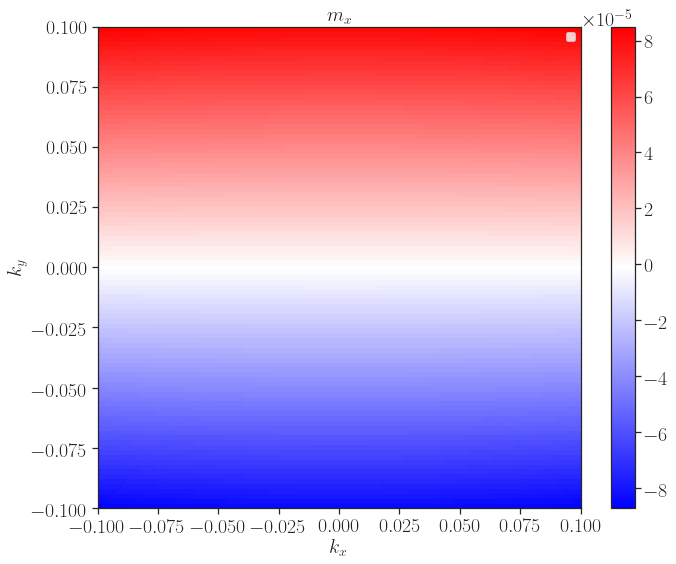

In [17]:
st = sns.axes_style("ticks")
sns.set(style = st,palette = sns.color_palette("muted"), rc={'figure.figsize': (10,8)})
plt.rcParams.update({
    "text.usetex": True,
    "font.family": "serif",
    "font.sans-serif": ["Computer Modern Roman"]})

#z = get_magnetization_y(k_z, k_y, k_z)
number_of_points = 100
smallest_value = -0.1
largest_value = 0.1
is_broken_inversion = True
chosen_axis = "x"
mag_grid, k_x, k_y, k_z = create_magmoment_grid(nr_points = number_of_points, min_point= smallest_value, max_point = largest_value, axis = chosen_axis, z_axis =  False, broken_inversion=is_broken_inversion)
fig, ax = plt.subplots()
heatmap = ax.pcolormesh(k_x, k_y, mag_grid, cmap = 'bwr')

fontSize = 20
ticksize = 20
plt.xlabel(r'$k_x$', fontsize = fontSize)
plt.ylabel(r'$k_y$',fontsize = fontSize)
#heatmap = ax.imshow(mag_grid, cmap = 'afmhot')
cb = fig.colorbar(heatmap, ax=ax)
cb.ax.tick_params(labelsize=ticksize)
plt.tick_params(axis='both', which='major', labelsize=ticksize)
plt.title(r"$m_{}$".format(chosen_axis), fontsize = fontSize)
cb.ax.yaxis.get_offset_text().set(size=ticksize)
ax.legend()
plt.tight_layout()
plt.savefig("magnetic_moment_{}.pdf".format(chosen_axis))
plt.show()


In [21]:
grid, k_x, k_y, k_z = create_magmoment_grid(10, -0.25, 0.25, "z", True, z_axis =  False)
print(grid)
print(np.shape(grid))

Current Index eigenvalue: 1
Total expression: [[-0.00036674+0.00038582j]]
M_z: 0
Current Index eigenvalue: 2
Total expression: [[0.00072734+1.25214298e-05j]]
M_z: [[0.00151265-0.00159135j]]
M_z_final: [[-0.00042847]]
Current Index eigenvalue: 1
Total expression: [[-0.00028323+0.0003242j]]
M_z: 0
Current Index eigenvalue: 2
Total expression: [[0.00041685-0.00016327j]]
M_z: [[0.00087432-0.0010008j]]
M_z_final: [[-0.00015255]]
Current Index eigenvalue: 1
Total expression: [[-0.00017537+0.00018802j]]
M_z: 0
Current Index eigenvalue: 2
Total expression: [[0.00023352-0.00012022j]]
M_z: [[0.0004616-0.00049488j]]
M_z_final: [[-6.09934258e-05]]
Current Index eigenvalue: 1
Total expression: [[-9.13506009e-05+9.89418894e-05j]]
M_z: 0
Current Index eigenvalue: 2
Total expression: [[0.00011663-6.97474293e-05j]]
M_z: [[0.00021987-0.00023814j]]
M_z_final: [[-2.63508722e-05]]
Current Index eigenvalue: 1
Total expression: [[-2.83190631e-05+3.10235341e-05j]]
M_z: 0
Current Index eigenvalue: 2
Total expr

### Get the derivative of the magnetic moment

Kinetic-magnetoelectric coefficient: $$ K_{ij} = \frac{1}{(2\pi)^3} \int_{\text{BZ}} \text{d}^3 k \; \partial_{k_i} m_j f(\epsilon_k)$$

Here we are interested in the $\partial_{k_i} m_j$ expression

In [9]:
def derivative_grid(nr_points, min_point, max_point, axis_m, axis_derivative, broken_inversion, z_axis =  False):
    
    k_x = k_y = np.linspace(min_point, max_point, nr_points)
    derivative_grid = np.zeros((nr_points,nr_points), dtype = float)

    if z_axis != False:
        k_z = np.linspace(min_point, max_point, nr_points)
    else:
        k_z = 0

    if k_z == 0:
        for i in k_y:
            for j in k_x:
                derivative = get_derivative(axis_derivative, axis_m, j, i)[0,0]
                x_index = (np.where(k_x == j))[0]
                y_index = (np.where(k_y == i))[0]
                print("x_index: {}; y_index: {}".format(x_index, y_index))
                print("Derivative at x: {}, y: {} is {}".format(j, i, derivative))
                derivative_grid[x_index, y_index] = derivative
        return derivative_grid, k_x, k_y





        # if axis_m == "y":
        #     print("Use the magnetic moment m_y")
        #     for i in k_y:
        #         for j in k_x:
        #             if axis_derivative == "x":
        #                 print("Use the magnetic moment m_y and take derivative wrt to k_x")
        #                 derivative = get_derivative(axis_derivative, axis_m, j, i)[0,0]
        #                 print(derivative)
        #                 x_index = (np.where(k_x == j))[0]
        #                 y_index = (np.where(k_y == i))[0]
        #                 print("x_index: {}; y_index: {}".format(x_index, y_index))
        #                 print("Derivative at x: {}, y: {} is {}".format(j, i, derivative))
        #                 derivative_grid[x_index, y_index] = derivative
        #             if axis_derivative == "y":
        #                 print("Use the magnetic moment m_y and take derivative wrt to k_y")
        #                 derivative = get_derivative(axis_derivative, axis_m, j, i)[0,0]
        #                 print(derivative)
        #                 x_index = (np.where(k_x == j))[0]
        #                 y_index = (np.where(k_y == i))[0]
        #                 print("x_index: {}; y_index: {}".format(x_index, y_index))
        #                 print("Derivative at x: {}, y: {} is {}".format(j, i, derivative))
        #                 derivative_grid[x_index, y_index] = derivative

        #             return derivative_grid, k_x, k_y

        # if axis_m == "x":
        #     print("Use the magnetic moment m_x")
        #     for i in k_y:
        #         for j in k_x:
        #             if axis_derivative == "y": 
        #                 print("Use the magnetic moment m_x and take derivative wrt to k_y")
        #                 derivative = get_derivative(axis_derivative, axis_m, j, i)[0,0]
        #                 print(derivative)
        #                 x_index = (np.where(k_x == j))[0]
        #                 y_index = (np.where(k_y == i))[0]
        #                 print("x_index: {}; y_index: {}".format(x_index, y_index))
        #                 print("Derivative at x: {}, y: {} is {}".format(j, i, derivative))
        #                 derivative_grid[x_index, y_index] = derivative
        #             if axis_derivative == "x":
        #                 print("Use the magnetic moment m_x and take derivative wrt to k_x")
        #                 derivative = get_derivative(axis_derivative, axis_m, j, i)[0,0]
        #                 print(derivative)
        #                 x_index = (np.where(k_x == j))[0]
        #                 y_index = (np.where(k_y == i))[0]
        #                 print("x_index: {}; y_index: {}".format(x_index, y_index))
        #                 print("Derivative at x: {}, y: {} is {}".format(j, i, derivative))
        #                 derivative_grid[x_index, y_index] = derivative

        #             return derivative_grid, k_x, k_y

        #                 #get_derivative(axis_derivative="x", axis_m, axis_m, j, i)
                    

def get_derivative(axis_derivative, axis_m, k_x, k_y):
    print("Use the magnetic_moment {} and take it with respect to k {}".format(axis_m, axis_derivative))

    dx = 0.05
    dy = 0.05
    
    if axis_derivative == "x": 
        print("Derivative along the x-axis")
        upper_derivative = get_magnetic_momentum(k_x + dx, k_y, 0, axis_m , broken_inversion = True)
        lower_derivative = get_magnetic_momentum(k_x - dx, k_y, 0, axis_m , broken_inversion = True)
        derivative = (upper_derivative - lower_derivative)/(2*dx)
        return derivative

    elif axis_derivative == "y":
        print("Derivative along the y-axis")
        upper_derivative = get_magnetic_momentum(k_x, k_y + dy, 0, axis_m , broken_inversion = True)
        lower_derivative = get_magnetic_momentum(k_x, k_y - dy, 0, axis_m , broken_inversion = True)
        derivative = (upper_derivative - lower_derivative)/(2*dy)
        return derivative 


In [10]:
k_x = np.linspace(-0.25, 0.25, 100)
k_y = 0
k_z = 0

x = []
mag = []
j = 0

for i in k_x:
    derivative = get_derivative("x", "y",i, k_y)[0,0]
    mag_moment = get_magnetic_momentum(i, 0, k_z, "y", True)[0,0]
    x.append(derivative)
    mag.append(mag_moment)
    j += 1
print(x)
print(mag)


Use the magnetic_moment y and take it with respect to k x
Derivative along the x-axis
First expression: [[0.+0.01385049j]]
Second expression: [[-0.02992-0.00496431j]]
First expression: [[0.+0.j]]
Second expression: [[0.+0.j]]
First expression: [[0.+0.02035432j]]
Second expression: [[-0.02992-0.01842955j]]
First expression: [[0.+0.j]]
Second expression: [[0.+0.j]]
First expression: [[0.+0.01722365j]]
Second expression: [[-0.02992-0.00944278j]]
First expression: [[0.+0.j]]
Second expression: [[0.+0.j]]
Use the magnetic_moment y and take it with respect to k x
Derivative along the x-axis
First expression: [[0.+0.01350492j]]
Second expression: [[-0.02992-0.00464298j]]
First expression: [[0.+0.j]]
Second expression: [[0.+0.j]]
First expression: [[0.+0.02006342j]]
Second expression: [[-0.02992-0.01715504j]]
First expression: [[0.+0.j]]
Second expression: [[0.+0.j]]
First expression: [[0.+0.01688878j]]
Second expression: [[-0.02992-0.00885214j]]
First expression: [[0.+0.j]]
Second expression:

Use the magnetic_moment x and take it with respect to k y
Derivative along the y-axis
First expression: [[0.01408686+0.00584142j]]
Second expression: [[-9.47521748e-17-0.00830783j]]
First expression: [[-0.02616391+0.00666314j]]
Second expression: [[1.1814844e-16-0.02010596j]]
First expression: [[0.02459521+0.01789855j]]
Second expression: [[-1.73001591e-16+0.01011355j]]
First expression: [[-0.01416873+0.02575102j]]
Second expression: [[1.45167738e-16-0.02237309j]]
x_index: [0]; y_index: [0]
Derivative at x: -0.25, y: -0.25 is 0.0052740345594480455
Use the magnetic_moment x and take it with respect to k y
Derivative along the y-axis
First expression: [[0.01467444+0.00552049j]]
Second expression: [[-2.39287627e-17-0.00759246j]]
First expression: [[-0.02585761+0.00640091j]]
Second expression: [[3.03086422e-17-0.02015228j]]
First expression: [[0.02505495+0.0168825j]]
Second expression: [[-5.99790171e-17+0.01066374j]]
First expression: [[-0.01370211+0.02454988j]]
Second expression: [[5.0469

No handles with labels found to put in legend.


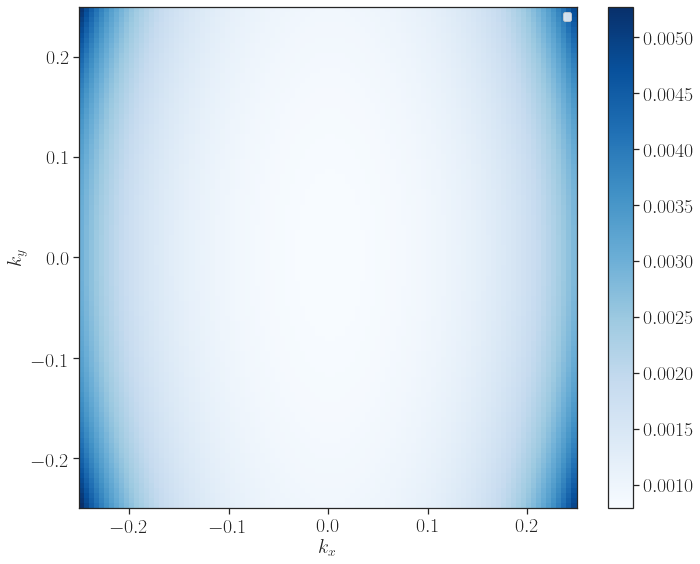

In [35]:
st = sns.axes_style("ticks")
sns.set(style = st,palette = sns.color_palette("muted"), rc={'figure.figsize': (10,8)})
plt.rcParams.update({
    "text.usetex": True,
    "font.family": "serif",
    "font.sans-serif": ["Computer Modern Roman"]})

axis_m = "x"
axis_derivative = "y"

nr_points =  100
derivative_mesh, k_x, k_y = derivative_grid(nr_points, -0.25, 0.25, axis_m, axis_derivative, True, z_axis =  False)

fig, ax = plt.subplots()
#plt.imshow(data, vmin=-10, vmax=10)

# divnorm=colors.TwoSlopeNorm(vmin=-0.005, vcenter=0.0, vmax=0.005)
divnorm=colors.TwoSlopeNorm(vmin=0.000, vcenter=0.0025, vmax=0.005)
divnorm2=colors.TwoSlopeNorm(vmin=-0.005, vcenter=-0.0025, vmax=0.000)
# heatmap = ax.pcolormesh(k_x, k_y, derivative_mesh, cmap = 'RdBu', norm = divnorm)


# heatmap = ax.pcolormesh(k_x, k_y, derivative_mesh, cmap = "bwr", norm = divnorm)
# heatmap = ax.pcolormesh(k_x, k_y, derivative_mesh, cmap = "bwr", norm = divnorm2)
# heatmap = ax.pcolormesh(k_x, k_y, derivative_mesh, cmap = "bwr")

# heatmap= ax.pcolormesh(k_x, k_y, derivative_mesh, cmap = "RdBu")
# heatmap = ax.pcolormesh(k_x, k_y, derivative_mesh, cmap = 'Blues')

# orig_map=plt.cm.get_cmap('Reds')
# reversed_map = orig_map.reversed()
# heatmap = ax.pcolormesh(k_x, k_y, derivative_mesh, cmap =  reversed_map)

orig_map = plt.cm.get_cmap("Blues")
# reversed_map = orig_map.reversed()
heatmap = ax.pcolormesh(k_x, k_y, derivative_mesh, cmap =  'Blues')


fontSize = 20
ticksize = 20
plt.xlabel(r'$k_x$', fontsize = fontSize)
plt.ylabel(r'$k_y$',fontsize = fontSize)
#plt.title("Derivative of m {} wrth to k{}".format(axis_m, axis_derivative), fontsize = fontSize)
#heatmap = ax.imshow(mag_grid, cmap = 'afmhot')
cb = fig.colorbar(heatmap, ax=ax)
cb.ax.tick_params(labelsize=ticksize)
plt.tick_params(axis='both', which='major', labelsize=ticksize)
cb.ax.yaxis.get_offset_text().set(size=ticksize)
plt.tight_layout()
ax.legend()
plt.savefig("der-{}_magnetic_moment-{}.pdf".format(axis_derivative, axis_m))
plt.show()


### Using Sympy symbolic matrices

In [18]:
def Hamiltonian_sym(a):
    '''
    a: Lattice constant

    '''

    k_x = sy.Symbol('k_x')
    k_y = sy.Symbol('k_y')
    k_z = sy.Symbol('k_z')

    i = np.imag(1j)

    t_1_eff = 0.0495
    t_2_eff = -0.0226
    t_3_eff = 0.0040
    t_4_eff = 0.1009
    t_5_eff = - 0.0019
    t_6_eff = - 0.0097
    t_7_eff = - 0.0159
    t_8_eff = 0.0022

    t_y = 0.0007

    #t_difference corresponds to t_13 - t_14
    t_difference = 0.0024

    var1  = (1.065 * k_z)**2*a**2

    h_11 = t_1_eff - t_2_eff*(k_x**2 + k_y**2)*a - t_3_eff*var1
    h_22 = t_4_eff - t_5_eff*k_x**2*a**2 - t_6_eff*k_y**2*a**2 -  t_7_eff*var1
    h_33 = t_4_eff - t_6_eff*k_x**2*a**2 - t_5_eff*k_y**2*a**2 - t_7_eff*var1
    h_12 = -2*t_difference*1.065*k_x*k_z*a**2 + i*t_8_eff*k_x*a
    h_13 = -2*t_difference*1.065*k_y*k_z*a**2 + i*t_8_eff*k_y*a
    h_23 = -4*t_y*k_x*k_y*a**2
    
    h_21 = np.conjugate(h_12)
    h_31 = np.conjugate(h_13)
    h_32 = np.conjugate(h_23)

    ham = sy.Matrix(3,3, [h_11, h_12, h_13, h_21, h_22, h_23, h_31, h_32, h_33 ])
    #eigenvalues = 
    #eigvals, U = np.linalg.eigh(ham)
    #print("Eigenvalues: {}".format(eigvals))

    #U = np.matrix(U)

    return ham

In [19]:
Hamiltonian_sym(1)

Matrix([
[      0.0226*k_x**2 + 0.0226*k_y**2 - 0.0045369*k_z**2 + 0.0495,                               -0.005112*k_x*k_z + 0.0022*k_x,                               -0.005112*k_y*k_z + 0.0022*k_y],
[-0.005112*conjugate(k_x)*conjugate(k_z) + 0.0022*conjugate(k_x), 0.0019*k_x**2 + 0.0097*k_y**2 + 0.0180341775*k_z**2 + 0.1009,                                              -0.0028*k_x*k_y],
[-0.005112*conjugate(k_y)*conjugate(k_z) + 0.0022*conjugate(k_y),                        -0.0028*conjugate(k_x)*conjugate(k_y), 0.0097*k_x**2 + 0.0019*k_y**2 + 0.0180341775*k_z**2 + 0.1009]])